In [1]:
# Useful imports
import numpy as np, matplotlib.pyplot as plt
import sys; sys.path.append('./')
import models
from data_loader import DataLoader
import emcee, corner
from sklearn.covariance import EmpiricalCovariance
import numpy.linalg as lin
import seaborn as sns

--------------
# Code to change!

In [2]:
# Which data to load?
# E_min : [0.676, 0.84 , 1.269, 1.741, 2.12 , 2.609, 2.609, 3.586, 4.332, 5.475]
# E_max : [0.706, 0.868, 1.292, 1.759, 2.137, 2.624, 2.624, 3.598, 4.342, 5.484]
E_min = 0.676 # MeV
E_max = 2.624 # MeV
which_data = 'som'

# Select the parameterization
# parameterization = 'init-f-wave'
parameterization = 'bs_C'

# Use theory cov?
use_theory_cov = True

# Information about the sampling
n_burn = 50000
n_steps = 200000

# Samples file
# file_name = './08_24_2023/0.676_to_{}_som-notheorycov/0.676_to_{}_som_with_bs_C.h5'.format(E_max, E_max)
file_name = './09_28_2023/run1/samples_1.h5'
# file_name = './0.676_to_4.342_som_with_bs_C.h5'

# Plot things?
plot_trace = True
plot_prob = False


# Correlation matrix (only ERPs vs. include all ERPs + norm)
just_ERPs = True

# Plot cross sections?
# If true, this takes a long time if they are not precomputed
plot_cs = False
# Cross sections file (If I precompute them)
cross_section_file = None


-------------------
Load in the data and normalization info

In [3]:
loader = DataLoader(E_min, E_max, which_data)

data = loader.get_data()
norm_group = loader.get_normalization_grouping()
gauss_prior_f = loader.get_normalization_prior_info()

-------------------
Set the labels and param priors to create the model

In [4]:
# # # Set the parameter bounds and initialize the model
if parameterization == 'standard':
    labels = ['A0', 'r0', 'A1+', 'r1+', 'P1+', 'A1-', 'r1-', 'P1-']
    sys.stderr.write('No Longer Supported....')
    sys.exit(-1)
elif parameterization == 'bound_state':
    labels = ['A0', 'r0', 'r1+', 'P1+', 'r1-', 'P1-']
    param_bounds = np.array([[-0.02, 0.06], [-3, 3], [-1, 1], [-6, 6], [-1, 1], [-6, 6]])
    params_prior = np.array([[0.025, 0.015], [0.8, 0.4], [0.0, 0.1], [0.0, 1.6], [0.0, 0.1], [0.0, 1.6]]) # center, width
    gauss_prior_params = np.hstack([param_bounds, params_prior])
    sys.stderr.write('Not implemented yet...')
    sys.exit(-1)
elif parameterization == 'bs_C':
    labels = ['A0', 'r0', 'C1+^2', 'P1+', 'C1-^2', 'P1-']
    param_bounds = np.array([[-0.02, 0.06], [-3, 3], [5.0, 25.0], [-6, 6], [5.0, 25.0], [-6, 6]])
    params_prior = np.array([[0.025, 0.015], [0.8, 0.4], [13.84, 1.63], [0.0, 1.6], [12.59, 1.85], [0.0, 1.6]]) # center, width
    gauss_prior_params = np.hstack([param_bounds, params_prior])
    model = models.BS_C(data, norm_group, gauss_prior_params, gauss_prior_f, use_theory_cov)
elif parameterization == 'init-f-wave':
    labels = ['A0', 'r0', 'C1+^2', 'P1+', 'C1-^2', 'P1-', 'r3+']
    param_bounds = np.array([[-0.02, 0.06], [-3, 3], [5.0, 25.0], [-6, 6], [5.0, 25.0], [-6, 6], [-3, 0]])
    params_prior = np.array([[0.025, 0.015], [0.8, 0.4], [13.84, 1.63], [0.0, 1.6], [12.59, 1.85], [0.0, 1.6], [-0.5, 1]]) # center, width
    gauss_prior_params = np.hstack([param_bounds, params_prior])
    model = models.F_Wave_AR(data, norm_group, gauss_prior_params, gauss_prior_f, use_theory_cov)

# Add normalization labels
for i in range(0, int(np.max(norm_group) + 1)):
    labels.append('f_{}'.format(i))

Load in the samples

In [5]:
# Load in the samples
reader = emcee.backends.HDFBackend(file_name)
samples_not_flat = reader.get_chain()
samples_flat = reader.get_chain(flat = True)

# Get the log prob
log_prob = reader.get_log_prob()

AttributeError: You must run the sampler with 'store == True' before accessing the results

Define functions that will create the trace plot for each walker, and also plot the log prob

In [ ]:
def generate_trace_plot(samples_not_flat, *args, **kwargs):
    # Generate the trace plot given a set of samples
    fig, axes = plt.subplots(samples_not_flat.shape[2], figsize = (20, 40))
    for i in range(0, samples_not_flat.shape[2]):
        ax = axes[i]
        for j in range(0, samples_not_flat.shape[1]):
            ax.plot(samples_not_flat[:, :, i][:, j])
            if labels is not None:
                ax.set_ylabel(labels[i])
    axes[-1].set_xlabel('Step Number')
    plt.show()

def plot_log_prob(n_start, log_prob, bad_indices = None):
    fig, ax = plt.subplots()
    for i in range(0, log_prob.shape[1]):
        if np.any(i == bad_indices):
            continue
        ax.plot(np.arange(n_start, log_prob.shape[0]), log_prob[n_start:, i])
    ax.set_xlabel('Step Number')
    ax.set_ylabel('ln(Prob)')
    plt.show()

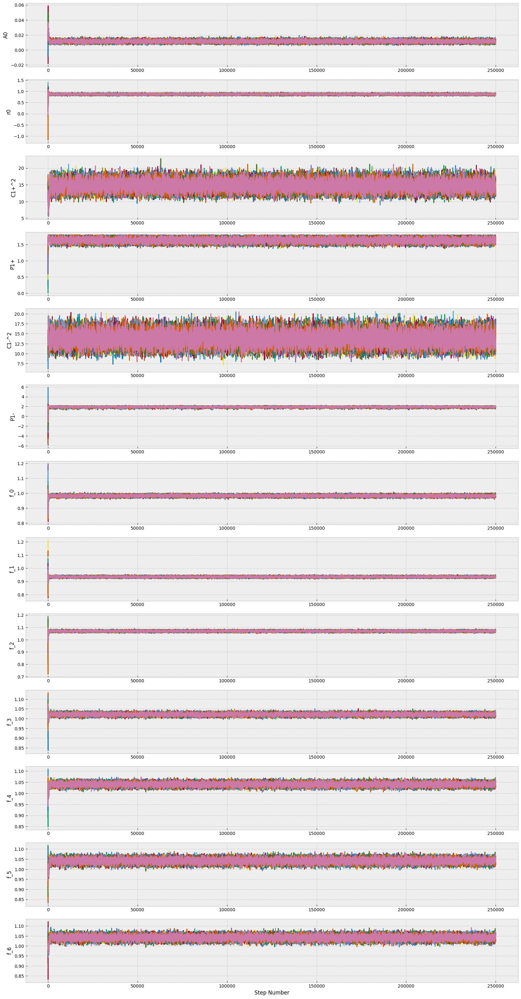

In [ ]:
if plot_trace:
    generate_trace_plot(samples_not_flat)

Check for any stuck walkers and remove them

In [ ]:
# # The above chunk of previous code that analyzes the chains to remove stuck walkers does not work. I need to look at the
# # within chain variance to see if it is stuck or not moving enough. 
# within_chain_means = np.mean(samples_not_flat[n_burn:, :, :], axis = 0)

# # Create an empty array of the within chain variances
# within_chain_var = np.empty(within_chain_means.shape)

# # Run a for loop across walkers to compute within chain variances
# for i in range(0, within_chain_means.shape[0]):
#     within_chain_var[i, :] = np.sum(np.square(within_chain_means[i, :] - samples_not_flat[n_burn:, i, :]), axis = 0) / n_steps

# # Get the typical within chain variance W
# W = np.median(within_chain_var, axis = 0)

# # Now we need to check if the variance is much smaller than the typical variance, then the chain is stuck or has not explored enough
# bad_indices = []
# ratios = []
# for i in range(0, within_chain_means.shape[1]):
#     normalized_ratio = np.sum(within_chain_var[i] / W) / within_chain_means.shape[1]
#     ratios.append(normalized_ratio)
#     if normalized_ratio <= 0.9:
#         bad_indices.append(i)

# bad_indices = np.array(bad_indices)
# ratios = np.array(ratios)
# print('Found {} bad walkers at indices:'.format(bad_indices.shape[0]))
# print(bad_indices)

# if bad_indices.shape[0] != 0:
#     # Remove the bad walkers
#     samples_not_flat = np.delete(samples_not_flat, bad_indices, axis = 1)

In [ ]:
# Look at the variances within each chain to determine if the walker is moving enough or if it is stuck.
within_chain_means = np.mean(samples_not_flat[n_burn:, :, :], axis = 0)

# Create an empty array of the within chain variances
within_chain_var = np.empty(within_chain_means.shape)

# Run a for loop across all walkers to compute the within chain variance
for i in range(0, within_chain_means.shape[0]):
    within_chain_var[i, :] = np.sum(np.square(within_chain_means[i, :] - samples_not_flat[n_burn:, i, :]), axis = 0) / (samples_not_flat.shape[0] // 2)

# Get the typical within chain variance W for each parameter
W = np.median(within_chain_var, axis = 0)


# Now we need to loop over each chain for each parameter to see how it compares to the typical variance
bad_indices = []
ratios = np.empty(within_chain_means.shape)
# Loop over each parameter
for i in range(0, within_chain_means.shape[1]):
    # Loop over the walkers
    for j in range(0, within_chain_means.shape[0]):
        ratio = np.sum(within_chain_var[j, i] / W[i]) / within_chain_means.shape[1]
        ratios[j, i] = ratio

# Sum along each parameter, this value should be very close to 1.0. Select out the bad indices
total_normalized_ratios = np.sum(ratios, axis = 1)
bad_indices = np.where(total_normalized_ratios <= 0.9)[0]
print('Found {} bad walkers at indices:'.format(bad_indices.shape[0]))
print(bad_indices)

if bad_indices.shape[0] != 0:
    # Remove the bad walkers
    samples_not_flat = np.delete(samples_not_flat, bad_indices, axis = 1)

Found 0 bad walkers at indices:
[]


In [ ]:
# len0, len1, len2 = samples_not_flat.shape
# samples = np.reshape(samples_not_flat, (len0 * len1, len2))

# corner.corner(samples[:, :model.erp_dim], labels = labels[:model.erp_dim], quantiles = [0.16, 0.5, 0.84], title_fmt = '.4f', show_titles = True)
# plt.suptitle("E_min = {} MeV, E_max = {} MeV, {} data".format(E_min, E_max, which_data))
# plt.show()

In [ ]:
# # The above chunk of previous code that analyzes the chains to remove stuck walkers does not work. I need to look at the
# # within chain variance to see if it is stuck or not moving enough. 
# within_chain_means = np.mean(samples_not_flat[n_burn:, :, :], axis = 0)

# # Create an empty array of the within chain variances
# within_chain_var = np.empty(within_chain_means.shape)

# # Run a for loop across walkers to compute within chain variances
# for i in range(0, within_chain_means.shape[0]):
#     within_chain_var[i, :] = np.sum(np.square(within_chain_means[i, :] - samples_not_flat[n_burn:, i, :]), axis = 0) / n_steps

# # Get the typical within chain variance W
# W = np.median(within_chain_var, axis = 0)

# # Now we need to check if the variance is much smaller than the typical variance, then the chain is stuck or has not explored enough
# bad_indices = []
# ratios = []
# for i in range(0, within_chain_means.shape[1]):
#     normalized_ratio = np.sum(within_chain_var[i] / W) / within_chain_means.shape[1]
#     ratios.append(normalized_ratio)
#     if normalized_ratio <= 0.9:
#         bad_indices.append(i)

# bad_indices = np.array(bad_indices)
# ratios = np.array(ratios)
# print('Found {} bad walkers at indices:'.format(bad_indices.shape[0]))
# print(bad_indices)

# if bad_indices.shape[0] != 0:
#     # Remove the bad walkers
#     samples_not_flat = np.delete(samples_not_flat, bad_indices, axis = 1)

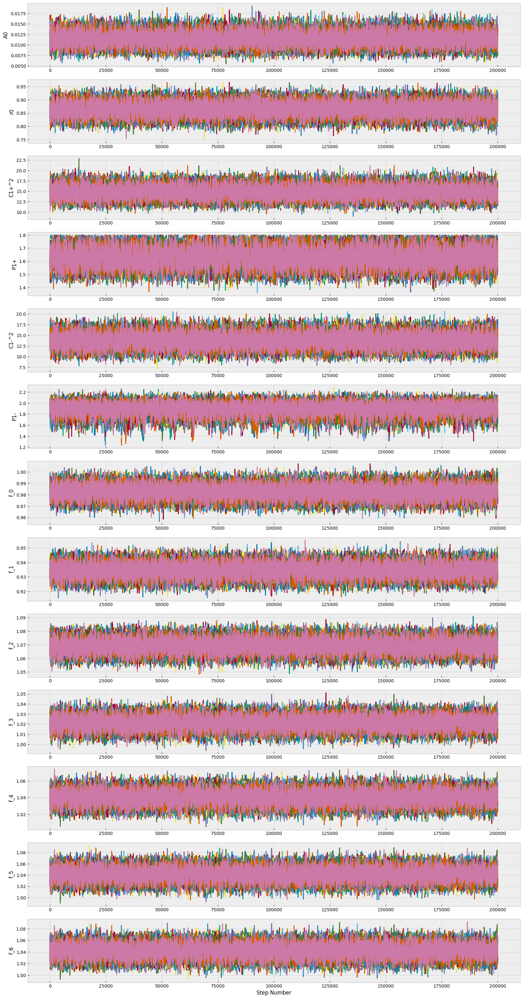

In [ ]:
if plot_trace:
    generate_trace_plot(samples_not_flat[n_burn:])

In [ ]:
if plot_prob:
    plot_log_prob(n_burn, log_prob)

Since we have removed any bad walkers (if there were any), we need to thin the remaining samples

In [ ]:
# Thin according to the burn-in time
thinned_samples_not_flat = samples_not_flat[n_burn:, :, :]
thinned_log_prob = log_prob[n_burn:, :]

# Compute the autocorrelation times for each parameter
ac_s = reader.get_autocorr_time(discard = n_burn, tol = 0)
ac = int(np.max(ac_s))

# Remove the bad chains
if bad_indices.shape[0] != 0:
    log_prob_remaining = np.delete(thinned_log_prob, bad_indices, axis = 1)
else:
    log_prob_remaining = thinned_log_prob

# Thin according to the autocorrelation time
thinned_samples_not_flat = thinned_samples_not_flat[::ac, :, :]
thinned_log_prob = log_prob_remaining[::ac, :]

# Flatten the samples and log-prob
len0, len1, len2 = thinned_samples_not_flat.shape
samples = np.reshape(thinned_samples_not_flat, (len0 * len1, len2))
log_prob_flat = np.reshape(thinned_log_prob, (len0 * len1))

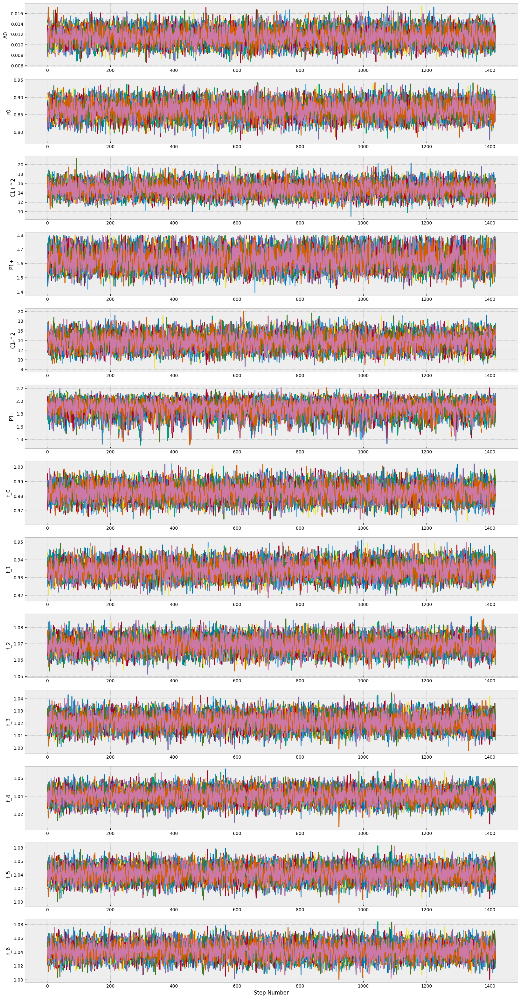

In [ ]:
if plot_trace:
    generate_trace_plot(thinned_samples_not_flat)


-------------------
# Generate the corner plot and correlation matrix

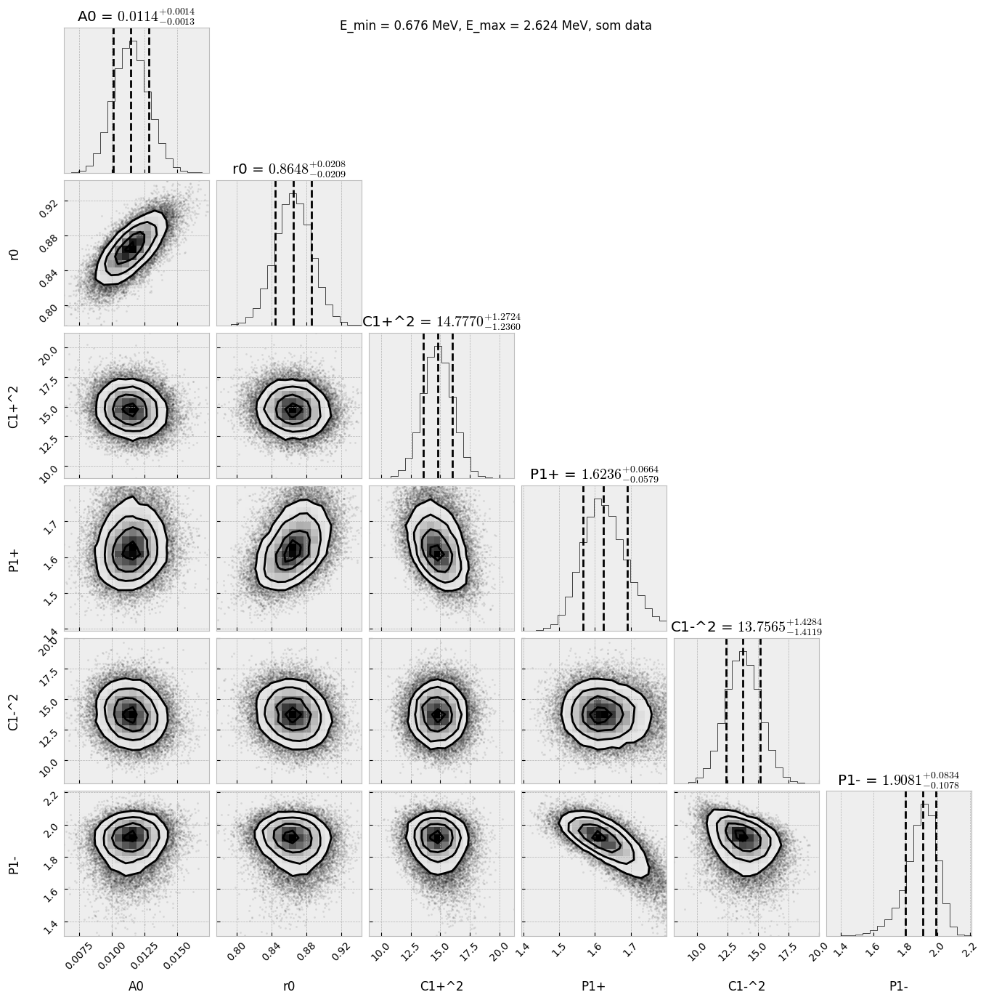

In [ ]:
corner.corner(samples[:, :model.erp_dim], labels = labels[:model.erp_dim], quantiles = [0.16, 0.5, 0.84], title_fmt = '.4f', show_titles = True)
plt.suptitle("E_min = {} MeV, E_max = {} MeV, {} data".format(E_min, E_max, which_data))
plt.show()

In [ ]:
samples.shape

(36894, 13)

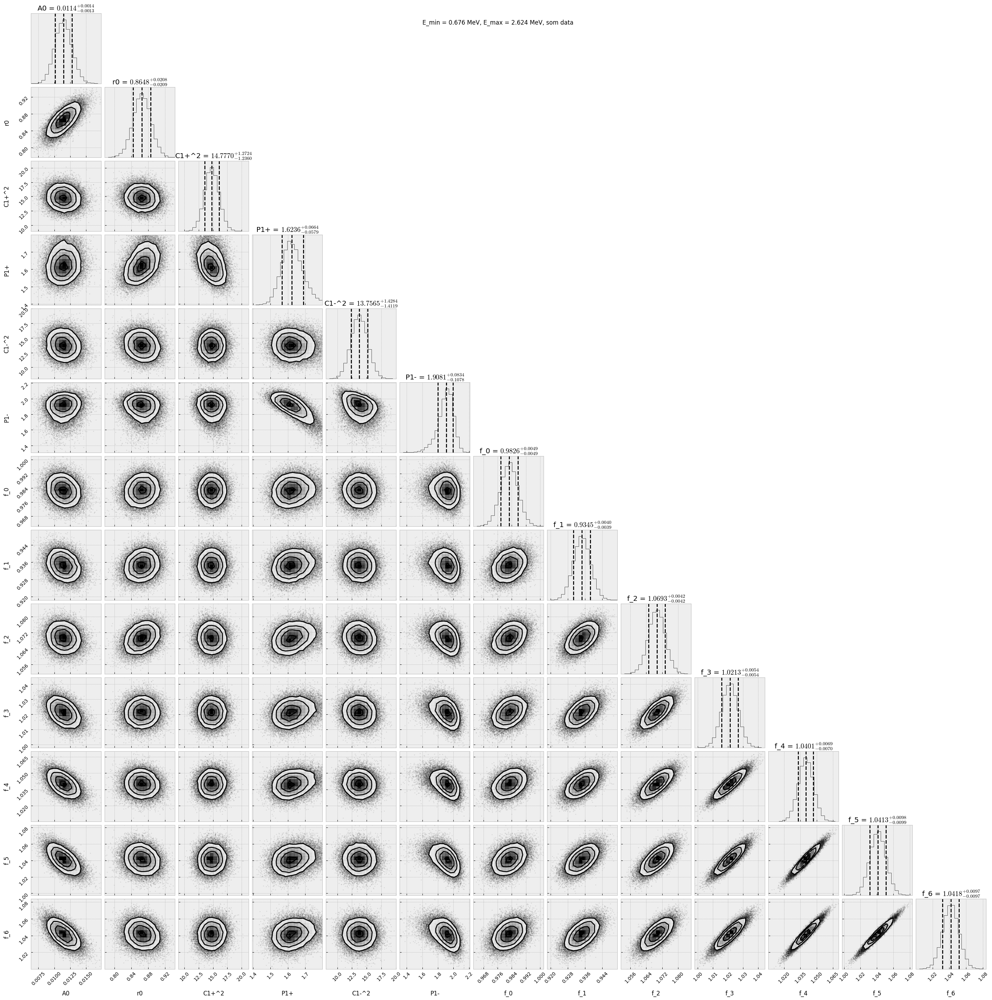

In [ ]:
corner.corner(samples[:], labels = labels, quantiles = [0.16, 0.5, 0.84], title_fmt = '.4f', show_titles = True)
plt.suptitle("E_min = {} MeV, E_max = {} MeV, {} data".format(E_min, E_max, which_data))
plt.show()

In [ ]:
# ############# Handle the bimodality of the samples
# bimodal_removed_samples = samples[np.where(samples[:, 3] < 1.76)]

# corner.corner(bimodal_removed_samples[:, :model.erp_dim], labels = labels, quantiles = [0.16, 0.5, 0.84], title_fmt = '.4f', show_titles = True)
# plt.suptitle("E_min = {} MeV, E_max = {} MeV, {} data\nTruncated".format(E_min, E_max, which_data))
# plt.show()

---------------------
## Map the r3+ to Gamma 7/2 -

In [ ]:
# # Extract the resonance parameters
# eta_R = model.eta_R
# k_R = model.gamma_R
# k_cR = model.k_cR

# # A3plus = (r3plus * k_R**2 / 2) - k_cR / 18 * (9 + eta_R**2) * (4 + eta_R**2) * (1 + eta_R**2)
# samples_copy = samples.copy()
# r3plus = samples_copy[:, 6]

# tau = 36 * (r3plus / 2) - (2 * k_cR * (14 * k_cR**4 + 98 * k_cR**2 * k_R**2 + 108 * k_R**4) * model.H_R.real) + (
#     k_cR**2 / k_R**3 * (k_cR**6 + 14 * k_cR**4 * k_R**2 + 49 * k_cR**2 * k_R**4 + 36 * k_R**6) * model.H_R_prime.real)

# C3_2R = (2 * np.pi * eta_R) / (np.exp(2 * np.pi * eta_R) - 1) * (9 + eta_R**2) * (4 + eta_R**2) * (1 + eta_R**2)

# samples_copy[:, 6] = - ((k_R**7 * C3_2R) / (model.mu * tau)) * (model.h_bar_c**2)

# labels[6] = '$\Gamma$7/2'
# # labels = np.array(labels)
# # labels2 = labels.copy()
# # labels2[6] = '$\Gamma$'
# # labels2 = list(labels2)

In [ ]:
# corner.corner(samples_copy[:, :model.erp_dim], labels = labels, quantiles = [0.16, 0.5, 0.84], title_fmt = '.4f', show_titles = True)
# plt.suptitle("E_min = {} MeV, E_max = {} MeV, {} data".format(E_min, E_max, which_data))
# plt.show()

---------------
The correlation matrix is related to the covariance matrix by
$$R_{ij} = \frac{C_{ij}}{\sqrt{C_{ii}C_{jj}}}$$

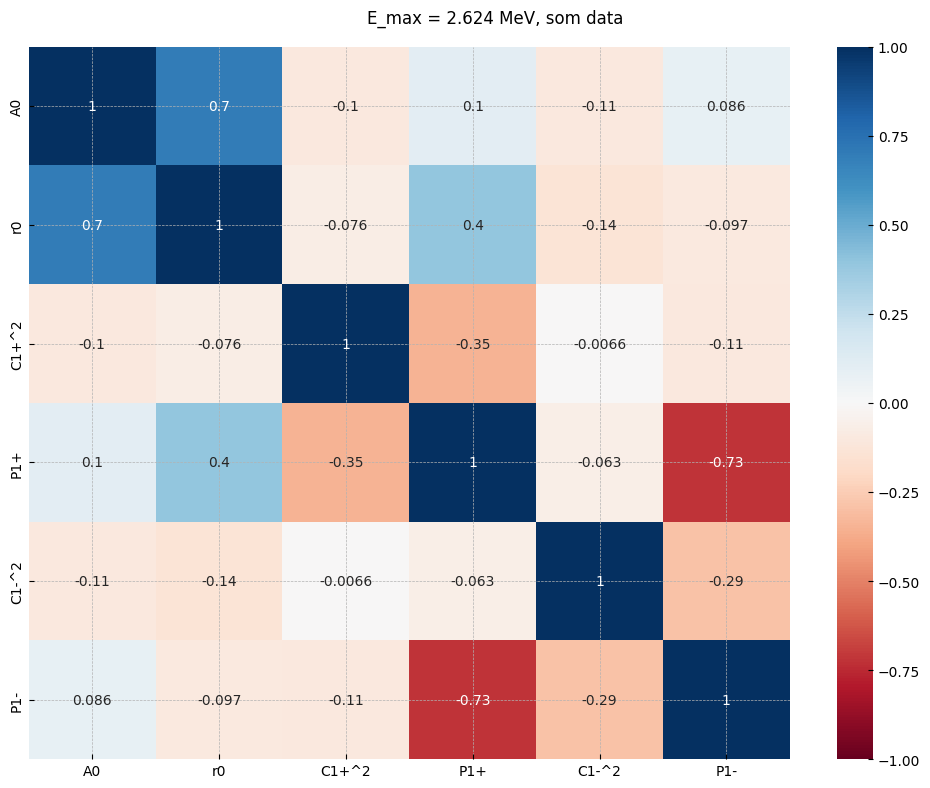

In [ ]:
if just_ERPs:
    emp_cov = EmpiricalCovariance().fit(samples[:, :model.erp_dim]).covariance_
else:
    emp_cov = EmpiricalCovariance().fit(samples).covariance_ # For all the parameters

correlation = np.zeros(emp_cov.shape)

for i in range(0, correlation.shape[0]):
    for j in range(0, correlation.shape[1]):
        correlation[i, j] = emp_cov[i, j] / np.sqrt(emp_cov[i, i] * emp_cov[j, j])

plt.figure(figsize = (10, 8))
cmap = "RdBu"
if just_ERPs:
    sns.heatmap(correlation, annot = True, xticklabels = labels[:model.erp_dim], yticklabels = labels[:model.erp_dim], cmap = cmap, vmin = -1, vmax = 1)
else:
    sns.heatmap(correlation, annot = True, cmap = cmap) # For all the parameters
    
plt.suptitle("E_max = {} MeV, {} data".format(E_max, which_data))
plt.tight_layout()
plt.show()

-----------------------------------------------------------------
## Load data \& plot cross sections

In [ ]:
# Set up root path for the data
root_path = './'

# Set up the list of paths to the data
barnard_paths = [root_path + 'barnard_data/barnard5477.txt',
                root_path + 'barnard_data/barnard6345.txt',
                root_path + 'barnard_data/barnard7395.txt',
                root_path + 'barnard_data/barnard9003.txt',
                root_path + 'barnard_data/barnard10460.txt',
                root_path + 'barnard_data/barnard11660.txt',
                root_path + 'barnard_data/barnard12530.txt',
                root_path + 'barnard_data/barnard14080.txt']

som_paths = [root_path + 'SOM/som_cm_int1.npy',
            root_path + 'SOM/som_cm_int2.npy',
            root_path + 'SOM/som_cm_int3.npy']


data_E_max = E_max
data_which_data = which_data


# Load in the data, specific to the set and the E_max

# Handle Barnard set first
barnard_data_list = []
for path in barnard_paths:
    barnard_data_list.append(np.loadtxt(path))

# Handle Som set
som_data_list = []
l_som = [] # For Som normalization
l_som_energies = []
for path in som_paths:
    data_set = np.load(path, allow_pickle = True)
    som_data_list.append(data_set)
    l_som_energies.append([data_set[i][:, 0][0] for i in range(len(data_set))])
    l_som.append([len(data_set[j]) for j in range(len(data_set))])

# Concatenate the datasets into arrays
barnard_data = np.concatenate(barnard_data_list)
som_temp = np.concatenate(np.concatenate(som_data_list)) 
l_som_energies = np.array(l_som_energies)
# 2x concatenate because it is a list of lists

# For some reason, the Som data is formatted [E, theta, cs, err] so I swap the
# columns to match the Barnard set followint [theta, E, cs, err]
som_data = np.column_stack([som_temp[:, 1], som_temp[:, 0], som_temp[:, 2], som_temp[:, 3]])

# Cap the energy at E_max
# NOTE: The Barnard data has lowest E at 2.439 MeV and the Som data has
# lowest E at 0.676 MeV
if data_E_max != None:
    barnard_indices = np.where(barnard_data[:, 1] <= data_E_max)
    som_indices = np.where(som_data[:, 1] <= data_E_max)
    barnard_data = barnard_data[barnard_indices]
    som_data = som_data[som_indices]

# Now select which data to use
if data_which_data == 'both':
    data = np.concatenate([barnard_data, som_data])
elif data_which_data == 'som':
    data = som_data
elif data_which_data == 'barnard':
    data = barnard_data
else:
    sys.stderr.write('Choose a \'which_data\': both, som, barnard...')
    sys.exit(-1)

In [ ]:
if plot_cs:  
    # # NOTE: Plotting only works currently for som energies

    # Set up the values for plotting
    theta_vals = np.linspace(40, 140, 100)
    param_set = samples[:, :model.erp_dim]
    normalizations = samples[:, model.erp_dim:]

    # Plot every plot_skip-th parameter (This speeds up the calculation by a bit)
    plot_skip = 25
    param_set = param_set[::plot_skip]

    # Plotting energies are at the 'nominal' energies between the lowest and highest energy of the interaction regions
    plotting_energy_pool = np.array([0.691, 0.854, 1.2803, 1.750, 2.129, 2.6163, 2.6163, 3.592, 4.337, 5.4797])

    plot_numbers = np.where(plotting_energy_pool <= E_max)[0]

    # l_som_energies = np.array([[0.676, 0.84 , 1.269, 1.741, 2.12 , 2.609, 3.586, 4.332, 5.475],
    #                            [0.691, 0.854, 1.28 , 1.75 , 2.129, 2.616, 3.592, 4.337, 5.48 ],
    #                            [0.706, 0.868, 1.292, 1.759, 2.137, 2.624, 3.598, 4.342, 5.484]])

    print('Number of curves: {}\nNumber of figures: {}'.format(param_set.shape[0], plot_numbers.shape[0]))

    fig, ax = plt.subplots(plot_numbers.shape[0], 1, figsize = (8, 1 + 5 * int(plot_numbers.shape[0])))

    # Define an array for all the cross sections
    all_cs = np.empty((plot_numbers.shape[0], param_set.shape[0], theta_vals.shape[0]))

    # If we only have one set of data to plot, ax[0] is not iterable so we have to manually set this
    if plot_numbers.shape[0] == 1:
        # Handle single plotting...
        pass
    else:
        for selection in plot_numbers:
            for i in range(0, param_set.shape[0]):
                cs = []
                for theta in theta_vals:
                    cross_section = model.get_cs_theory(param_set[i], theta, plotting_energy_pool[selection]) * normalizations[i, selection]
                    all_cs[np.where(plot_numbers == selection)[0][0], i, np.where(theta_vals == theta)[0][0]] = cross_section
                    cs.append(cross_section)
                ax[selection].plot(theta_vals, cs)
                
            # Plot the data
            for energy in l_som_energies[:, selection]:
                indices = np.where(data[:, 1] == energy)
                tmp = data[indices]
                ax[selection].errorbar(tmp[:, 0], tmp[:, 2], yerr = tmp[:, 3], fmt = '.')

            
            ax[selection].set_xlabel('$\\theta$ [deg]')
            ax[selection].set_ylabel('CS [relative to Rutherford]')
            ax[selection].set_title('E = {:.4f} MeV'.format(plotting_energy_pool[selection]))

    fig.suptitle('E_min = {} MeV, E_max = {} MeV'.format(E_min, E_max))
    plt.tight_layout()
    plt.show()

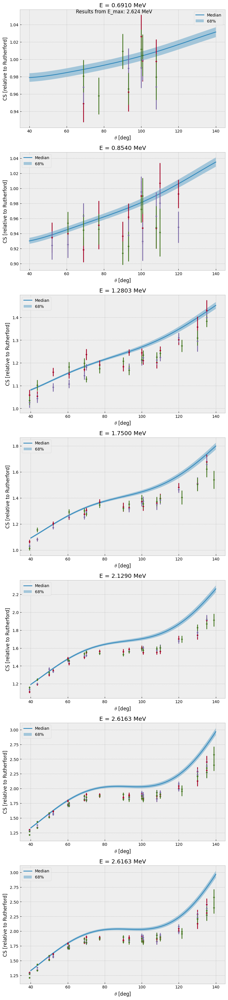

In [ ]:
# Write code here to compute the bands of cross sections

# Create an empty array for the quantiles
band_cs = np.empty((plot_numbers.shape[0], 3, theta_vals.shape[0]))

# Compute the quantiles
for i in range(0, plot_numbers.shape[0]):
    band_cs[i] = np.quantile(all_cs[i], [0.16, 0.5, 0.84], axis = 0)

fig, ax = plt.subplots(plot_numbers.shape[0], 1, figsize = (8, 5 * int(plot_numbers.shape[0])))

# Plot the 1 sigma band
for i in range(0, plot_numbers.shape[0]):
    ax[i].plot(theta_vals, band_cs[i, 1, :], label = 'Median')
    ax[i].fill_between(theta_vals, band_cs[i, 0, :], band_cs[i, 2, :], alpha = 0.4, label = '68%')
    ax[i].set_xlabel('$\\theta$ [deg]')
    ax[i].set_ylabel('CS [relative to Rutherford]')
    ax[i].set_title('E = {:.4f} MeV'.format(plotting_energy_pool[i]))
    ax[i].legend()

# Plot the data
for j in plot_numbers:
    for energy in l_som_energies[:, j]:
        indices = np.where(data[:, 1] == energy)
        tmp = data[indices]
        ax[j].errorbar(tmp[:, 0], tmp[:, 2], yerr = tmp[:, 3], fmt = '.')

            



plt.suptitle('Results from E_max: {} MeV'.format(E_max))
plt.tight_layout()
plt.show()

------------------
# Extra Stuff To Do

In [ ]:
# Compute the chi^2 for the median of the parameters

median_params = np.median(samples, axis = 0)

params_f = median_params[model.erp_dim:]
params = median_params[:model.erp_dim]

theory = model.cs_theory(params)
norm = params_f[model.norm_grouping.astype(int)]

chi2 = model.chi_squared(theory, norm)[0]

print('Straight chi2: ', chi2)

print('Chi2 per dof: ', chi2 / data.shape[0])


Straight chi2:  (525.245795351434+0j)
Chi2 per dof:  (1.792647765704553+0j)


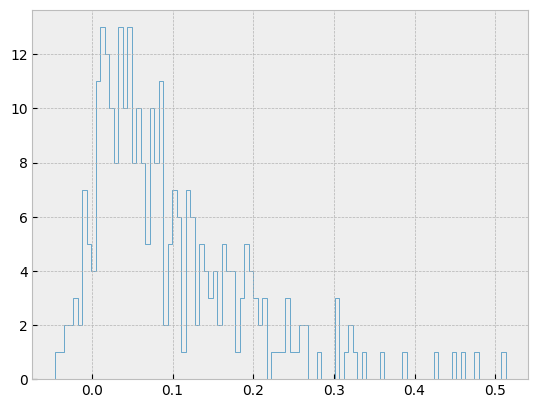

In [ ]:
# Plot residual distributions
residuals = norm * theory - model.cs_data


fig, ax = plt.subplots()

counts, bins = np.histogram(residuals, bins = 100)
ax.stairs(counts, bins)

In [ ]:
all_cs.shape # Each cs value
# theta_vals.shape # Theta values to plot wrt

(7, 1763, 100)

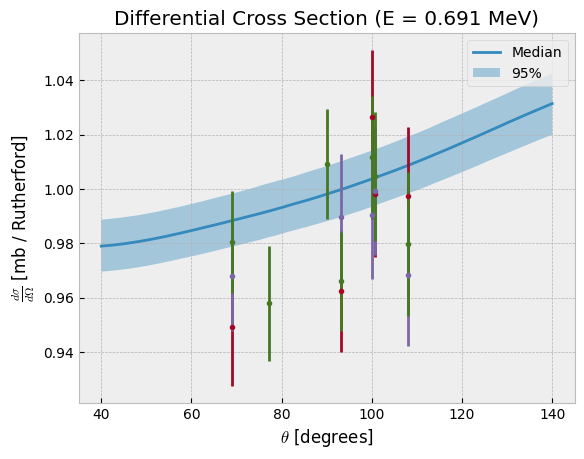

In [ ]:
# # # Delete this code
# Generating figure for presentations

select = 0

plt.style.use('bmh')

fig, ax = plt.subplots()

# Create an empty array for the quantiles
band_cs = np.empty((plot_numbers.shape[0], 3, theta_vals.shape[0]))

# Compute the quantiles
for i in range(0, plot_numbers.shape[0]):
    band_cs[i] = np.quantile(all_cs[i], [0.025, 0.5, 0.975], axis = 0)

# Plot the 1 sigma band
ax.plot(theta_vals, band_cs[select, 1, :], label = 'Median')
ax.fill_between(theta_vals, band_cs[select, 0, :], band_cs[select, 2, :], alpha = 0.4, label = '95%')


# Plot the data
for energy in l_som_energies[:, select]:
    indices = np.where(data[:, 1] == energy)
    tmp = data[indices]
    ax.errorbar(tmp[:, 0], tmp[:, 2], yerr = tmp[:, 3], fmt = '.')

ax.set_title('Differential Cross Section (E = {:.3f} MeV)'.format(np.mean(l_som_energies[:, select])))
ax.set_xlabel('$\\theta$ [degrees]')
ax.set_ylabel('$\\frac{d \sigma}{d \Omega}$ [mb / Rutherford]')
ax.legend()

plt.show()

In [ ]:
np.save('./09_28_2023/run1/samples_1.npy', samples)